# ROBOD, Room-level Occupancy and Building Operation Dataset

This notebook provides a step-by-step guide on how to (1) load and analyse the dataset, (2) visualise missing data for each room, (3) perform data post-processing steps, and finally (4) perform data visualisations using ROBOD.


#### Study Building Description
The study building considered in this dataset is the School of Design and Environment 4 (SDE4) building located at the National University of Singapore. SDE4 is a 6-story academic building spanning 8,588 square meters. It is the first newly-built net-zero energy building in Singapore and the first building in South Asia that obtained a Zero Energy Certification.

We collected the room occupancy and building operation data for five rooms located at different building levels, including two different-sized lecture rooms (Room 1 and Room 2), an office space for administrative staff (Room 3), an office space for researchers (Room 4), and a library space for students (Room 5). 


#### Dataset Description
The ROBOD dataset is currently hosted on figshare [ https://doi.org/10.6084/m9.figshare.19234530.v3 ] and consists of five separate CSV files. Each file contains the data collected from each room and consists of six different data categories, including indoor environmental quality data, Wi-Fi data, energy consumption data, HVAC operations data, outdoor weather data, and occupancy data.


#### Citation
If you are interested in using this dataset, please cite our work as follows: \
To be updated

# 1. Load and Analyse the Dataset

In [76]:
# import libraries
import os.path
import sys
from copy import deepcopy

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import style
from matplotlib.ticker import MaxNLocator
import missingno as msno
import seaborn as sns

from sklearn.impute import KNNImputer

In [77]:
# load the ROBOD dataset for each room
room_names = ["Room"+str(x) for x in range(1,6)]
data_dict = {}

for room in room_names:
    data_dict[room] = {}
    data_dict[room]["raw"] = pd.read_csv("E:/Code/FYP/robod-master/Data/combined_{}.csv".format(room))
    print("Generating information for {}".format(room))
    print(data_dict[room]["raw"].info())
    print()

Generating information for Room1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8352 entries, 0 to 8351
Data columns (total 28 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   timestamp                          8352 non-null   object 
 1   voc                                8338 non-null   float64
 2   sound_pressure_level               8338 non-null   float64
 3   indoor_relative_humidity           8338 non-null   float64
 4   air_temperature                    8352 non-null   float64
 5   illuminance                        8338 non-null   float64
 6   pm2.5                              8338 non-null   float64
 7   indoor_co2                         8338 non-null   float64
 8   wifi_connected_devices             8352 non-null   float64
 9   ceiling_fan_energy                 8352 non-null   float64
 10  lighting_energy                    8352 non-null   float64
 11  plug_load_energy       

In [79]:
# Saving Path
save_pth = os.path.join(os.getcwd(),"additional")
if not os.path.exists(save_pth):
    os.mkdir(save_pth)

def save(filename):
    return os.path.join(save_pth,filename)

# 2. Visualisations of Missing Data

Due to issues related to sensor error, we begin by visualising the missing/errorenous data points in ROBOD.

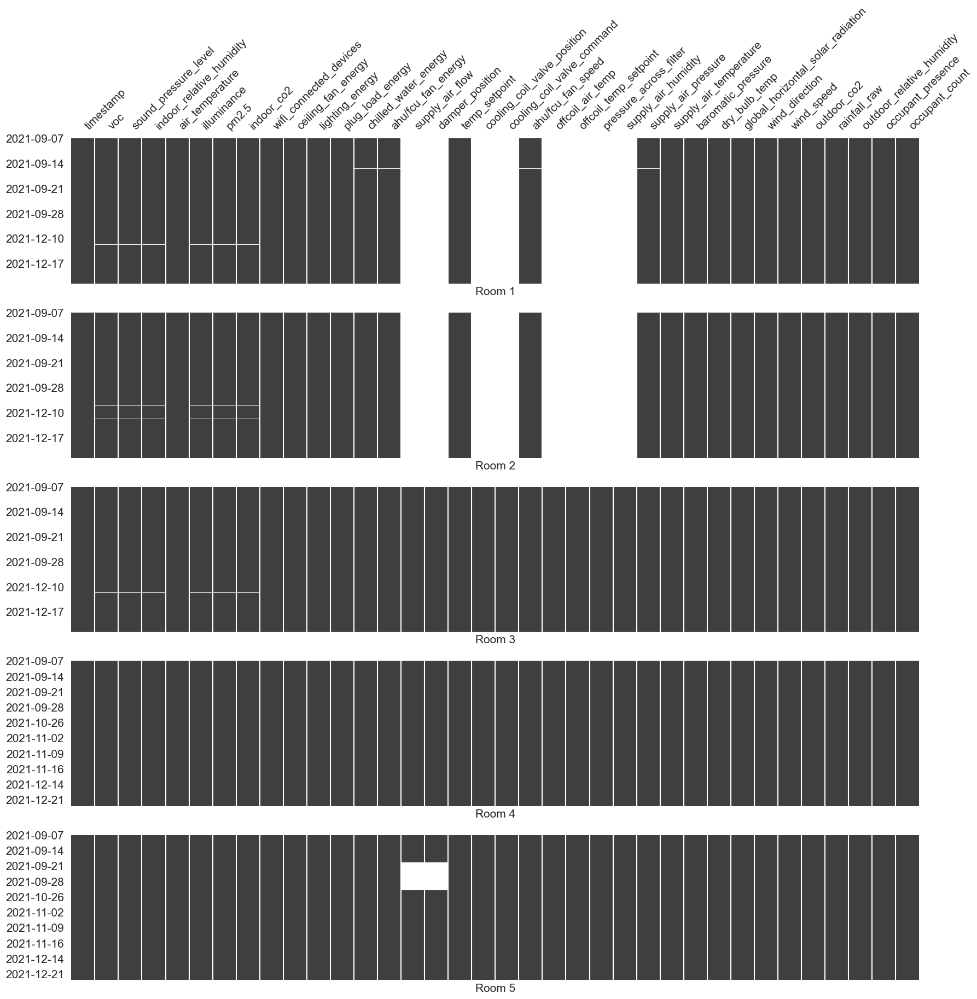

In [80]:
ROOM1_2_COLUMNS = ['timestamp', 'voc', 'sound_pressure_level', 'indoor_relative_humidity',  'air_temperature',
                   'illuminance', 'pm2.5', 'indoor_co2', 'wifi_connected_devices', 'ceiling_fan_energy',
                   'lighting_energy', 'plug_load_energy', 'chilled_water_energy', 'fcu_fan_energy',
                   'supply_air_flow', 'damper_position', 'temp_setpoint',  'cooling_coil_valve_position',
                   'cooling_coil_valve_command', 'fcu_fan_speed', 'offcoil_air_temp',
                   'offcoil_temp_setpoint', 'pressure_across_filter', 'supply_air_humidity',
                   'supply_air_pressure', 'supply_air_temperature', 'baromatic_pressure', 'dry_bulb_temp',
                   'global_horizontal_solar_radiation', 'wind_direction', 'wind_speed', 'outdoor_co2',
                   'rainfall_raw', 'outdoor_relative_humidity',  'occupant_presence', 'occupant_count']

ROOM3_5_COLUMNS = ['timestamp', 'voc', 'sound_pressure_level', 'indoor_relative_humidity',  'air_temperature',
                   'illuminance', 'pm2.5', 'indoor_co2', 'wifi_connected_devices', 'ceiling_fan_energy',
                   'lighting_energy', 'plug_load_energy', 'chilled_water_energy', 'ahu_fan_energy',
                   'supply_air_flow', 'damper_position', 'temp_setpoint',  'cooling_coil_valve_position',
                   'cooling_coil_valve_command', 'ahu_fan_speed', 'offcoil_air_temp',
                   'offcoil_temp_setpoint', 'pressure_across_filter', 'supply_air_humidity',
                   'supply_air_pressure', 'supply_air_temperature', 'baromatic_pressure', 'dry_bulb_temp',
                   'global_horizontal_solar_radiation', 'wind_direction', 'wind_speed', 'outdoor_co2',
                   'rainfall_raw', 'outdoor_relative_humidity',  'occupant_presence', 'occupant_count']

def plot_missing_data():
    fig, axs = plt.subplots(len(room_names), figsize=(20,20))

    for i in range(len(room_names)):
        room_name = room_names[i]
        raw_room_data1 = deepcopy(data_dict[room_name]["raw"])
        raw_room_data2 = deepcopy(data_dict[room_name]["raw"])
        raw_room_data1[["date","time","utc_offset"]] = raw_room_data1["timestamp"].str.split(' ',expand=True) 
        
        if room_name in ["Room1", "Room2"]:
            DATA_COLUMNS = ROOM1_2_COLUMNS
        else:
            DATA_COLUMNS = ROOM3_5_COLUMNS
        
        for col in DATA_COLUMNS:
            if col not in list(raw_room_data2.columns):
                raw_room_data2[col] = np.nan
        raw_room_data2 = raw_room_data2[DATA_COLUMNS]
        if room_name in ["Room1", "Room2"]:
            raw_room_data2.rename(columns={"fcu_fan_speed":"ahu/fcu_fan_speed", 
                                           "fcu_fan_energy":"ahu/fcu_fan_energy"}, 
                                  inplace=True)
        else:
            raw_room_data2.rename(columns={"ahu_fan_speed":"ahu/fcu_fan_speed", 
                                           "ahu_fan_energy":"ahu/fcu_fan_energy"}, 
                                  inplace=True)

        msno.matrix(raw_room_data2, ax=axs[i], sparkline=False)
        axs[i].set_xlabel("Room {}".format(room_name[-1]), fontsize=15)
        if i == 0:
            axs[i].set_xticklabels(labels=list(raw_room_data2.columns), fontsize=15)
        else:
            axs[i].set_xticklabels(labels=[])
        axs[i].set_yticks(np.arange(0,len(raw_room_data1),288*5-1))
        axs[i].set_yticklabels([raw_room_data1.loc[i,"date"] for i in np.arange(0,len(raw_room_data1),288*5-1)], 
                               fontsize=15)

    plt.savefig(save('missing_data.png'), dpi=600, bbox_inches="tight")

plot_missing_data()

# 3. (Optional) Data Post-Processing / Data Imputation

Due to the presence of missing data in the raw dataset, some data post-processing steps can be applied to impute the missing sensor data to prepare the dataset for other downstream analysis or applications. In this case, the MissForest algorithm from the <em>missingpy</em> library is used, which performs column-wise imputation in an iterative fashion.

More details about the MissForest imputation algorithm can be found in the manuscript:
Stekhoven, Daniel J., and Peter Bühlmann. "MissForest—non-parametric missing value imputation for mixed-type data." Bioinformatics 28.1 (2011): 112-118.

In [81]:
# Perform data imputation using missingpy library
def impute_missing_data(room, data):
    if os.path.isfile("ROBOD/combined_{}_imputed.csv".format(room)):
        return pd.read_csv("ROBOD/combined_{}_imputed.csv".format(room))
    
    original_col_sequence = list(data.columns)
    # imputer = MissForest(smooth=5)
    imputer = KNNImputer(n_neighbors=10)

    data_without_timestamp = data.drop(columns=["timestamp"])
    data_without_timestamp_cols = list(data_without_timestamp.columns)
    imputed_data_without_timestamp = imputer.fit_transform(data_without_timestamp)
    imputed_data_without_timestamp = pd.DataFrame(imputed_data_without_timestamp, columns=data_without_timestamp_cols)
    imputed_data = pd.concat([data[["timestamp"]], imputed_data_without_timestamp], axis=1)
    imputed_data = imputed_data[original_col_sequence]

    assert imputed_data.shape == data.shape
    assert imputed_data["timestamp"].tolist() == data["timestamp"].tolist()
    assert imputed_data["occupant_count"].tolist() == data["occupant_count"].tolist()
    assert imputed_data.isnull().values.sum() == 0

    return imputed_data

for room in room_names:
    imputed_data = impute_missing_data(room, data_dict[room]["raw"])
    data_dict[room]["imputed"] = imputed_data
    imputed_data.to_csv(save("combined_{}_imputed.csv".format(room)), index=False)
    print("Generating information for {}".format(room))
    print(imputed_data.info())
    print()

Generating information for Room1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8352 entries, 0 to 8351
Data columns (total 28 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   timestamp                          8352 non-null   object 
 1   voc                                8352 non-null   float64
 2   sound_pressure_level               8352 non-null   float64
 3   indoor_relative_humidity           8352 non-null   float64
 4   air_temperature                    8352 non-null   float64
 5   illuminance                        8352 non-null   float64
 6   pm2.5                              8352 non-null   float64
 7   indoor_co2                         8352 non-null   float64
 8   wifi_connected_devices             8352 non-null   float64
 9   ceiling_fan_energy                 8352 non-null   float64
 10  lighting_energy                    8352 non-null   float64
 11  plug_load_energy       

(## 4. Technical Validation Visualisations

The following visualisations are performed on the columns related to occupant count, outdoor environmental condition, room temperature setpoint, room air temperature, and energy consumption values for HVAC, lighting and plug loads. It should be noted that the visualisations below are based on the raw dataset for each room.

### Room Names and Color Setting

In [82]:
room_mapping = {"Room1":"Room 1",
                "Room2":"Room 2",
                "Room3":"Room 3",
                "Room4":"Room 4",
                "Room5":"Room 5"}

colour_mapping = {"Room1":"#1f77b4",
                  "Room2":"#ff7f0e",
                  "Room3":"#2ca02c",
                  "Room4":"#d62728",
                  "Room5":"#9467bd"}

ytick_spacing = {"Room1":2,
                 "Room2":3,
                 "Room3":2,
                 "Room4":4,
                 "Room5":3}

### Figure 1. Occupancy Count - Line Plot

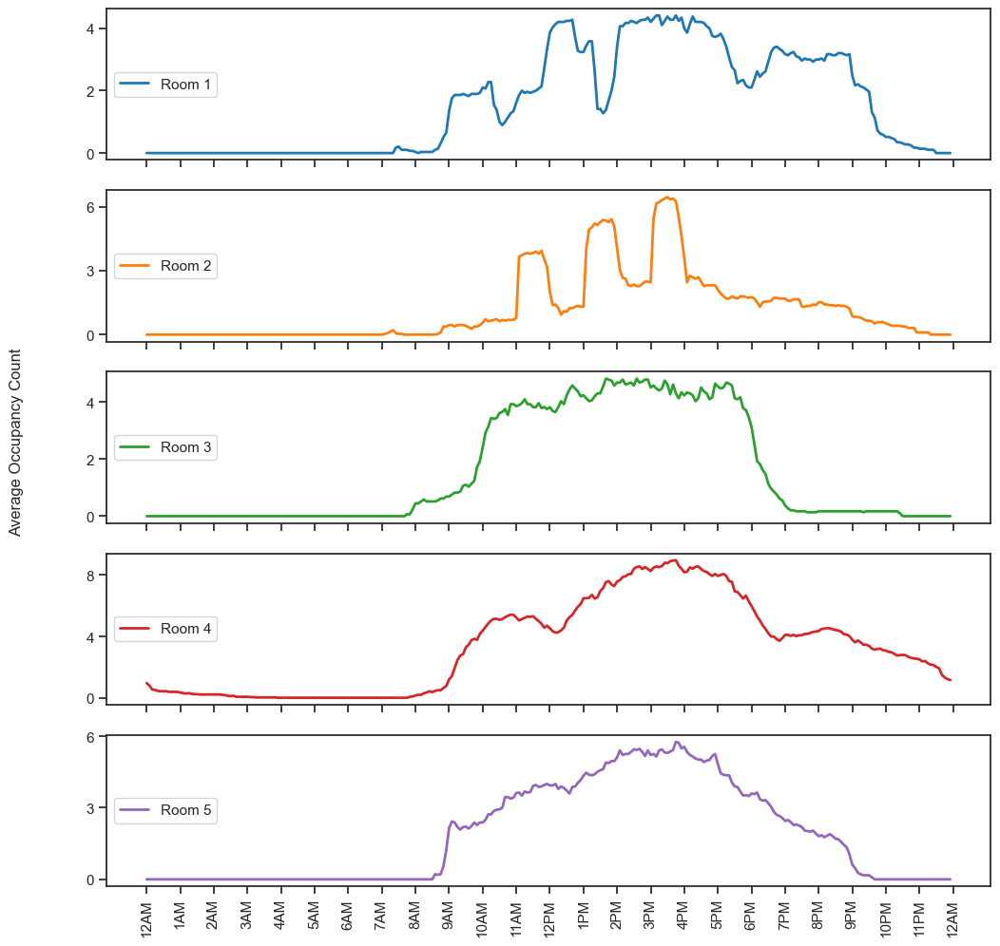

In [83]:
def generate_occupancy_graph(plot_presence=True):
    fig, axs = plt.subplots(len(room_names), figsize=(12,12))
        
    for i in range(len(room_names)):
        # load data and preprocess columns
        room_name = room_names[i]
        data = data_dict[room_name]["raw"]
        data[["date","time","utc_offset"]] = data["timestamp"].str.split(' ',expand=True)
    
        if plot_presence:
            data = data.rename(columns={"occupant_presence": "occupancy"})
        else:
            data = data.rename(columns={"occupant_count": "occupancy"})

        # calculate average occupancy on average weekday
        all_dates = data["date"].unique()
        tmp_array = np.zeros((len(all_dates), 288))
        for j in range(len(all_dates)):
            tmp_array[j,:] = data[data["date"]==all_dates[j]]["occupancy"].values.reshape(1,-1)
        occupancy_data = tmp_array.mean(axis=0)
        
        # plot occupancy plot for room
        axs[i].plot(range(occupancy_data.shape[0]), 
                    occupancy_data, 
                    linewidth=2, 
                    color=colour_mapping[room_name], 
                    label=room_mapping[room_name])
        axs[i].legend(loc="center left")
        axs[i].yaxis.set_major_locator(MaxNLocator(integer=True))
        axs[i].set_yticks(np.arange(0, 
                                    max(occupancy_data)+1, 
                                    ytick_spacing[room_name]))
    
    # beautify occupancy plot
    time_labels = ["12AM","1AM","2AM","3AM","4AM","5AM",
                   "6AM","7AM","8AM","9AM","10AM","11AM",
                   "12PM","1PM","2PM","3PM","4PM","5PM",
                   "6PM","7PM","8PM","9PM","10PM","11PM","12AM"]    
    plt.setp(axs, 
             xticks=np.arange(0, occupancy_data.shape[0]+1, 12), 
             xticklabels=[])
    plt.xticks(np.arange(0, occupancy_data.shape[0]+1, 12),
               time_labels,
               rotation=90)
    
    if plot_presence:
        fig.text(0.04, 0.5, "Occupancy Probability", va='center', rotation='vertical')
    else:
        fig.text(0.04, 0.5, "Average Occupancy Count", va='center', rotation='vertical')
    plt.savefig(save('occupancy_plot.png'), dpi=600, bbox_inches="tight")
    plt.show()
    
generate_occupancy_graph(plot_presence=False)

### Figure 2. Occupancy Count - Box Plot

In [84]:
def generate_occupancy_graph_v2():
    sns.set_theme(style = "ticks")
    f, axs = plt.subplots(len(room_names),1,figsize = (6*2, 8*2), dpi=800)

    for room_name in room_names:
        ax = axs[int(room_name[-1:])-1]
        room_data = data_dict[room_name]["raw"]
        room_data[["date","time","utc_offset"]] = room_data["timestamp"].str.split(' ',expand=True)
        room_data[["hour","minute"]] = room_data["time"].str.split(':',expand=True)
        room_data = data_dict[room_name]["raw"]
        sns.boxplot(data=room_data,x='hour',y='occupant_count',ax=ax, color=colour_mapping[room_name],linewidth=2)
        plt.setp(ax.lines, color=".3")
        ax.set_xticks ([0,3,6,9,12,15,18,21])
        ax.set_xticklabels(['12AM','3AM','6AM','9AM','12PM','3PM','6PM','9PM'])
        ax.set_xlabel('Time', fontsize=13)
        ax.set_ylabel('Occupancy Count', fontsize=13)

    plt.tight_layout()
    plt.savefig(save('occupancy_plot_v2.png'), dpi=600, bbox_inches="tight")
    plt.show()

generate_occupancy_graph_v2()

### Figure 3. Outdoor Environmental Condition

In [85]:
def smooth(y, pt):
    b = np.ones(pt)/pt
    y_sth = np.convolve(y, b, mode='same')
    return y_sth

def generate_outdoor_graph(plot_outdoor=True):
    sns.set_theme(style = "ticks")   
    f, (ax1,ax2,ax3,ax4) = plt.subplots(4,1,figsize = (6*2, 3.5*3), dpi=800)

    data = data_dict["Room1"]["raw"]
    data[["date","time","utc_offset"]] = data["timestamp"].str.split(' ',expand=True)
    data[["hour","minute"]] = data["time"].str.split(':',expand=True)
    data["minOfDay"] = data["hour"]*60 + data["minute"]
    
    sns.boxplot(data=data,x='hour',y='dry_bulb_temp', ax=ax1,color='#ff7f0e',linewidth=2)  
    plt.setp(ax1.lines, color=".3")
    ax1.set_xticks ([0,3,6,9,12,15,18,21])
    ax1.set_xticklabels(['12AM','3AM','6AM','9AM','12PM','3PM','6PM','9PM'])
    ax1.set_xlabel('Time', fontsize=13)
    ax1.set_ylabel('Outdoor dry-bulb\n temperature ($^\circ$C)', fontsize=13)
    
    sns.scatterplot(data=data,x='minOfDay',y='global_horizontal_solar_radiation',ax=ax2,color='#ff7f0e', 
                    alpha=0.7)  
    sns.lineplot(x=data['minOfDay'],y=smooth(data['global_horizontal_solar_radiation'],5),ax=ax2,
                 linewidth=2,color='.3')
 
    ax2.set_xlim(0,287)
    ax2.set_xticks ([1,37,73,109,145,181,217,253])
    ax2.set_xticklabels(['12AM','3AM','6AM','9AM','12PM','3PM','6PM','9PM'])
    
    ax2.set_xlabel('Time', fontsize=13)
    ax2.set_ylabel('Global horizontal\n solar radiation ($W/m^2$)', fontsize=13)

    sns.histplot(data=data,x='outdoor_relative_humidity', ax=ax3,kde=True,color='#ff7f0e') 
    ax3.set_xlabel('Outdoor relative humidity (%)', fontsize=13)
    ax3.set_ylabel('Count', fontsize=13)

    sns.histplot(data=data,x='outdoor_co2', ax=ax4,kde=True,color='#ff7f0e') 
    ax4.set_xlabel('Outdoor CO2 (ppm)', fontsize=13)
    ax4.set_ylabel('Count', fontsize=13)

    plt.tight_layout()
    plt.savefig(save("Outdoor.png"))
    plt.show()
    
generate_outdoor_graph(plot_outdoor=True)

### Figure 4. Room Temperature Setpoint

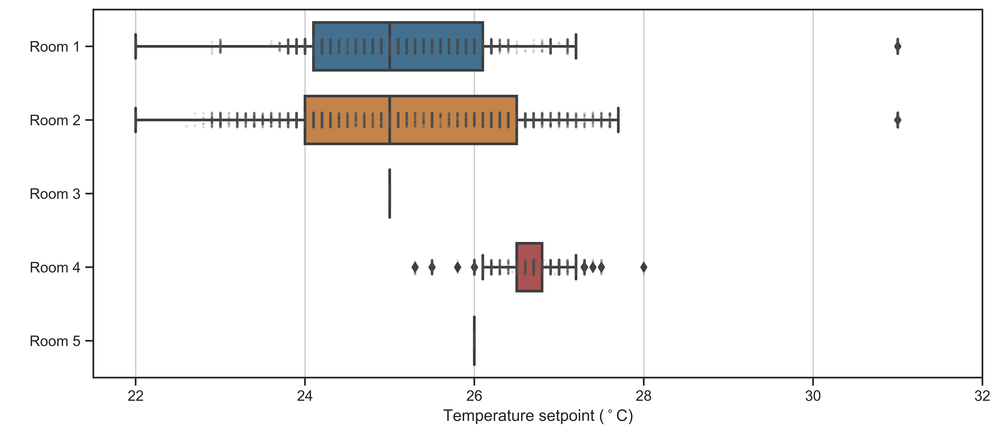

In [86]:
palette = ["#1f77b4","#ff7f0e","#2ca02c","#d62728","#9467bd"]

Tsp = pd.DataFrame()

def generate_Tsp_graph(plot_Tsp=True):
    sns.set_theme(style="ticks")  
    f, ax = plt.subplots(figsize = (6*2, 2.5*2), dpi=800)
        
    for room_name in room_names:
        room_label = room_mapping[room_name]
        data = data_dict[room_name]["raw"]
        Tsp[room_label] = data["temp_setpoint"]
        
    sns.boxplot(x="value", y="variable", data=pd.melt(Tsp),
                palette=palette, saturation=0.5, linewidth=2, width=.65) 

    sns.stripplot(x="value", y="variable", data=pd.melt(Tsp),
                  size=2, color=".3", linewidth=0,alpha=.2)

    ax.set_xlim(21.5, 32)
    ax.xaxis.grid(True)
    ax.set(xlabel = "Temperature setpoint ($^\circ$C)")
    ax.set(ylabel = " ")

    plt.savefig(save("Tsp.png"), bbox_inches='tight')
    plt.show()
      
generate_Tsp_graph(plot_Tsp=True)

### Figure 5. Room Air Temperature

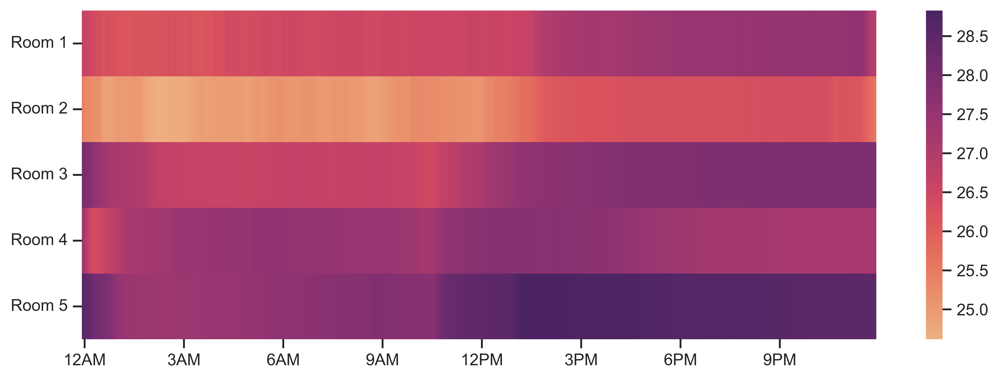

In [87]:
Tia = pd.DataFrame()

def generate_Tia_graph(plot_Tia=True):
    f, ax = plt.subplots(figsize = (6*2, 2*2), dpi=800)
        
    for room_name in room_names:
        room_label = room_mapping[room_name]
        data = data_dict[room_name]["raw"]
        data[["date","time","utc_offset"]] = data["timestamp"].str.split(' ',expand=True)

        all_dates = data["date"].unique()
        tmp_array = np.zeros((len(all_dates), 288))
        for j in range(len(all_dates)):
            tmp_array[j,:] = data[data["date"]==all_dates[j]]["air_temperature"].values.reshape(1,-1)
        Tia[room_label] = tmp_array.mean(axis=0)
        
    sns.heatmap(data=Tia.T,cmap='flare',yticklabels=['Room 1','Room 2','Room 3','Room 4','Room 5'])  
    ax.set_xlim(0,288)
    ax.set_xticks ([1,37,73,109,145,181,217,253])
    ax.set_xticklabels(['12AM','3AM','6AM','9AM','12PM','3PM','6PM','9PM'])
    plt.xticks(rotation=0) 
    plt.yticks(rotation=0) 
    plt.savefig(save("Tia.png"), bbox_inches='tight')
    plt.show()
    
generate_Tia_graph(plot_Tia=True)

### Figure 6. Energy Consumption

In [88]:
# For cooling energy
rooms_C = ["Room1", "Room2", "Room3", "Room4"]
room_mapping_C = {"Room1":"Room 1", 
                "Room2":"Room 2", 
                "Room3":"Room 3", 
                "Room4":"Room 4 + Room 5"}
fan_energy_col_mapping = {"Room1":"fcu_fan_energy", 
                          "Room2":"fcu_fan_energy", 
                          "Room3":"ahu_fan_energy", 
                          "Room4":"ahu_fan_energy"}

coolingEnergy = pd.DataFrame()
plugEnergy = pd.DataFrame()
lightingEnergy = pd.DataFrame()

def generate_energy_graph(plot_energy=True):
    sns.set_theme(style="ticks") 
    f, (ax1,ax2,ax3) = plt.subplots(3,1,figsize = (6*2, 3.5*3), dpi=800)
    
    # Cooling energy 
    for room_name_C in rooms_C:
        room_label = room_mapping_C[room_name_C]
        data = data_dict[room_name_C]["raw"]
        data[["date","time","utc_offset"]] = data["timestamp"].str.split(' ',expand=True)
        data[["hour","minute"]] = data["time"].str.split(':',expand=True)
        
        all_dates = data["date"].unique()
        tmp_coil = np.zeros((len(all_dates), 288))
        tmp_fan = np.zeros((len(all_dates), 288))
        
        for j in range(len(all_dates)):
            tmp_coil[j,:] = data[data["date"]==all_dates[j]]["chilled_water_energy"].values.reshape(1,-1)
            tmp_fan[j,:] = data[data["date"]==all_dates[j]][fan_energy_col_mapping[room_name_C]].values.reshape(1,-1)
          
        coolingEnergy[room_label] = tmp_coil.mean(axis=0) + tmp_fan.mean(axis=0)
        sns.lineplot(data=coolingEnergy[room_label],label=room_label,color=colour_mapping[room_name_C],linewidth=2.5,ax=ax1) 
    
    # Plug load and lighting
    for room_name in room_names:
        room_label = room_mapping[room_name]
        data = data_dict[room_name]["raw"]
        data[["date","time","utc_offset"]] = data["timestamp"].str.split(' ',expand=True)
        data[["hour","minute"]] = data["time"].str.split(':',expand=True)
        
        all_dates = data["date"].unique()
        tmp_plug = np.zeros((len(all_dates), 288))
        tmp_lighting = np.zeros((len(all_dates), 288))
        
        for j in range(len(all_dates)):
            tmp_plug[j,:] = data[data["date"]==all_dates[j]]["plug_load_energy"].values.reshape(1,-1)
            tmp_lighting[j,:] = data[data["date"]==all_dates[j]]["lighting_energy"].values.reshape(1,-1)
        
        plugEnergy[room_label] = tmp_plug.mean(axis=0) 
        lightingEnergy[room_label] = tmp_lighting.mean(axis=0)

        sns.lineplot(data=plugEnergy[room_label],label=room_label,color=colour_mapping[room_name],ax=ax2, linewidth=2) 
        sns.lineplot(data=lightingEnergy[room_label],label=room_label,color=colour_mapping[room_name],ax=ax3, linewidth=2) 
    
    for j in [ax1,ax2,ax3]:
        j.set_xlim(0,287)
        j.set_xticks ([1,37,73,109,145,181,217,253])
        j.set_xticklabels(['12AM','3AM','6AM','9AM','12PM','3PM','6PM','9PM'])

    ax1.set_ylabel('Cooling (kWh)', fontsize=13)
    ax2.set_ylabel('Plug load (kWh)', fontsize=13)
    ax3.set_ylabel('Lighting (kWh)', fontsize=13)
    ax3.set_xlabel('Time', fontsize=13)

    plt.savefig(save("EnergyConsumption.png"), bbox_inches='tight')
    plt.show()


generate_energy_graph(plot_energy=True)